In [1]:
# os Module for path
import os

# Data Analysis Modules
import numpy as np
import pandas as pd

# Data Visualization Modules
import matplotlib.pyplot as plt
import seaborn as sns

# Normalization of the data
from sklearn.preprocessing import StandardScaler

# Data splitting Module
from sklearn.model_selection import train_test_split

# Handle Imbalanced Data Module
## upsampling
from imblearn.over_sampling import RandomOverSampler
## down sampling
from imblearn.under_sampling import RandomUnderSampler

# statistics module
from scipy import stats
from sklearn.feature_selection import chi2

# Random Forest Model Module
from sklearn.ensemble import RandomForestClassifier

# Importing metrics used for evaluation of our models
from sklearn import metrics
from sklearn.metrics import classification_report

# Hyperparameter tuning and Cross Validation
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold

# Evaluation
from sklearn.metrics import classification_report,plot_confusion_matrix,accuracy_score


In [2]:
#Setting Default Parameters to Visualization Tools
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
pd.set_option('display.max_columns',29)

In [3]:
# importing the data from specific directory
os.chdir(r"C:\Users\M M N V SARMA\Desktop\Project CKD")
ckd_dataset = pd.read_csv("ckd.csv",header = 0,na_values = '?')
ckd_dataset.head(n = 20)

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wbcc,rbcc,htn,dm,cad,appet,pe,ane,class
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,36.0,1.2,NaN,NaN,15.4,44.0,7800.0,5.2,yes,yes,no,good,no,no,ckd
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,18.0,0.8,NaN,NaN,11.3,38.0,6000.0,NaN,no,no,no,good,no,no,ckd
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,NaN,NaN,9.6,31.0,7500.0,NaN,no,yes,no,poor,no,yes,ckd
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32.0,6700.0,3.9,yes,no,no,poor,yes,yes,ckd
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,NaN,NaN,11.6,35.0,7300.0,4.6,no,no,no,good,no,no,ckd
5,60.0,90.0,1.015,3.0,0.0,NaN,NaN,notpresent,notpresent,74.0,25.0,1.1,142.0,3.2,12.2,39.0,7800.0,4.4,yes,yes,no,good,yes,no,ckd
6,68.0,70.0,1.010,0.0,0.0,NaN,normal,notpresent,notpresent,100.0,54.0,24.0,104.0,4.0,12.4,36.0,NaN,NaN,no,no,no,good,no,no,ckd
7,24.0,NaN,1.015,2.0,4.0,normal,abnormal,notpresent,notpresent,410.0,31.0,1.1,NaN,NaN,12.4,44.0,6900.0,5.0,no,yes,no,good,yes,no,ckd
8,52.0,100.0,1.015,3.0,0.0,normal,abnormal,present,notpresent,138.0,60.0,1.9,NaN,NaN,10.8,33.0,9600.0,4.0,yes,yes,no,good,no,yes,ckd
9,53.0,90.0,1.020,2.0,0.0,abnormal,abnormal,present,notpresent,70.0,107.0,7.2,114.0,3.7,9.5,29.0,12100.0,3.7,yes,yes,no,poor,no,yes,ckd


In [4]:
# information about the datatypes and null_value count
ckd_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     391 non-null    float64
 1   bp      388 non-null    float64
 2   sg      353 non-null    float64
 3   al      354 non-null    float64
 4   su      351 non-null    float64
 5   rbc     248 non-null    object 
 6   pc      335 non-null    object 
 7   pcc     396 non-null    object 
 8   ba      396 non-null    object 
 9   bgr     356 non-null    float64
 10  bu      381 non-null    float64
 11  sc      383 non-null    float64
 12  sod     313 non-null    float64
 13  pot     312 non-null    float64
 14  hemo    348 non-null    float64
 15  pcv     329 non-null    float64
 16  wbcc    294 non-null    float64
 17  rbcc    269 non-null    float64
 18  htn     398 non-null    object 
 19  dm      400 non-null    object 
 20  cad     398 non-null    object 
 21  appet   399 non-null    object 
 22  pe

In [5]:
# summing all the Null values
ckd_dataset.isnull().sum()

age        9
bp        12
sg        47
al        46
su        49
rbc      152
pc        65
pcc        4
ba         4
bgr       44
bu        19
sc        17
sod       87
pot       88
hemo      52
pcv       71
wbcc     106
rbcc     131
htn        2
dm         0
cad        2
appet      1
pe         1
ane        1
class      0
dtype: int64

In [6]:
# describing about the data set to find the statistical information
ckd_dataset.describe()

,age,bp,sg,al,su,bgr,bu,sc,sod,pot,hemo,pcv,wbcc,rbcc
count,391.000000,388.000000,353.000000,354.000000,351.000000,356.000000,381.000000,383.000000,313.000000,312.000000,348.000000,329.000000,294.000000,269.000000
mean,51.483376,76.469072,1.017408,1.016949,0.450142,148.036517,57.425722,3.072454,137.528754,4.627244,12.526437,38.884498,8406.122449,4.707435
std,17.169714,13.683637,0.005717,1.352679,1.099191,79.281714,50.503006,5.741126,10.408752,3.193904,2.912587,8.990105,2944.474190,1.025323
min,2.000000,50.000000,1.005000,0.000000,0.000000,22.000000,1.500000,0.400000,4.500000,2.500000,3.100000,9.000000,2200.000000,2.100000
25%,42.000000,70.000000,1.010000,0.000000,0.000000,99.000000,27.000000,0.900000,135.000000,3.800000,10.300000,32.000000,6500.000000,3.900000
50%,55.000000,80.000000,1.020000,0.000000,0.000000,121.000000,42.000000,1.300000,138.000000,4.400000,12.650000,40.000000,8000.000000,4.800000
75%,64.500000,80.000000,1.020000,2.000000,0.000000,163.000000,66.000000,2.800000,142.000000,4.900000,15.000000,45.000000,9800.000000,5.400000
max,90.000000,180.000000,1.025000,5.000000,5.000000,490.000000,391.000000,76.000000,163.000000,47.000000,17.800000,54.000000,26400.000000,8.000000


# Handling Null Values

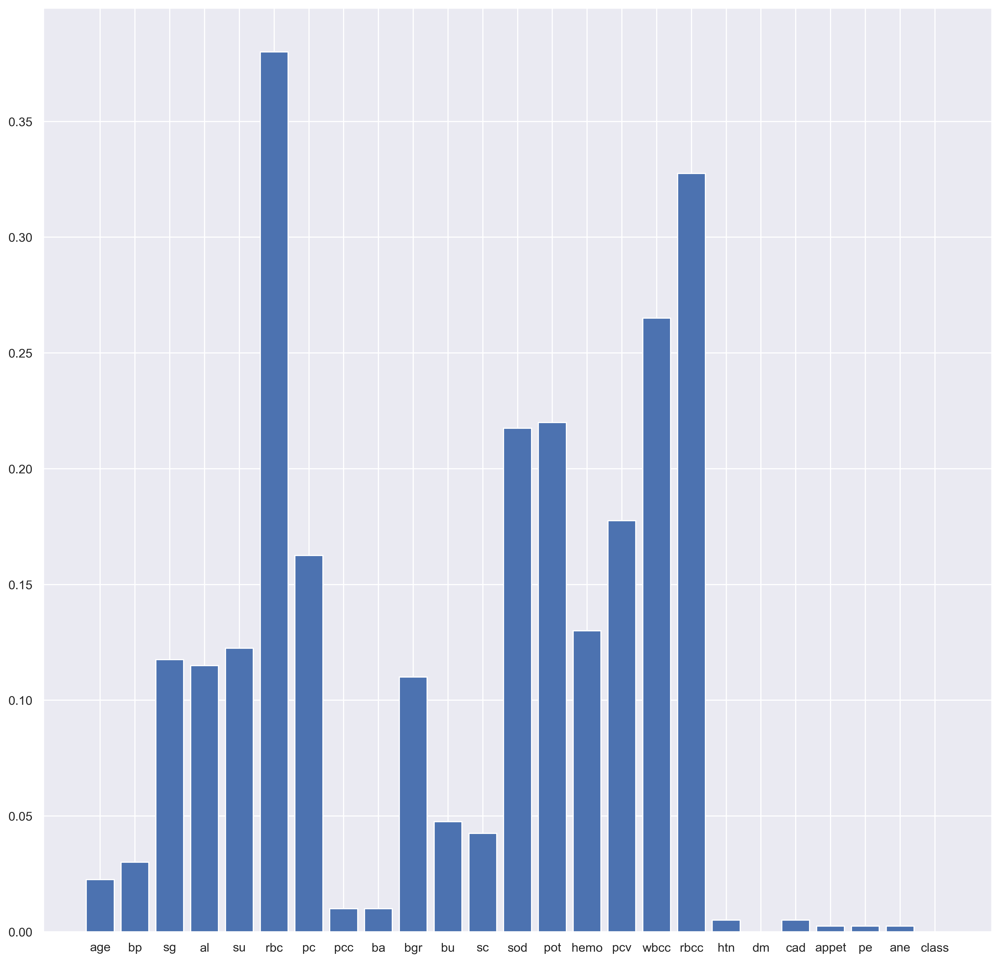

In [7]:
# defining the size of the figure
plt.figure(figsize = (15,15)) 
# calculating the sum of all null values from dataset divided by no.of rows to find the proportion
p = ((ckd_dataset.isnull().sum()/ckd_dataset.shape[0]))
# Calling the bar plot and passing the dataset and proportion values
plt.bar(ckd_dataset.columns,p)
# will display the graph on the screen
plt.show()

# Age

C:\Users\M M N V SARMA\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='age', ylabel='Density'>

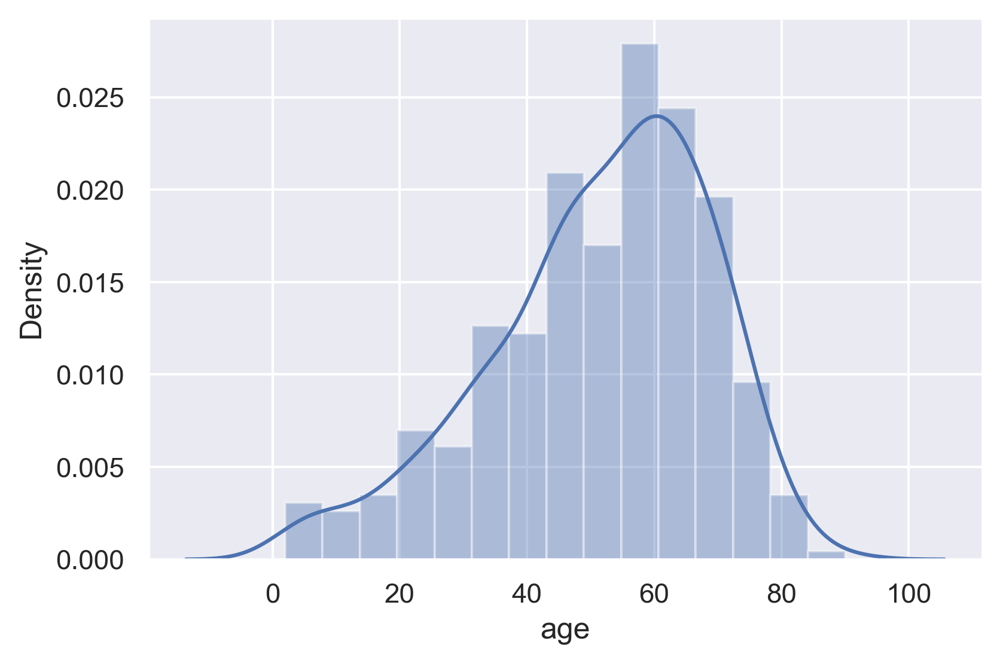

In [8]:
# by using the seaborn distribution plot for age
sns.distplot(ckd_dataset.age)

In [9]:
# substuate the null values with median values of the age feature
ckd_dataset['age'] = ckd_dataset['age'].replace(np.NaN,ckd_dataset['age'].median())

# Blood Pressure (bp)

In [10]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.bp.unique()

array([ 80.,  50.,  70.,  90.,  nan, 100.,  60., 110., 140., 180., 120.])

In [11]:
# Replace the null values with mode value
ckd_dataset.bp = ckd_dataset.bp.replace(np.NaN,ckd_dataset.bp.mode()[0])

# Specific Gravity (sg)

In [12]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.sg.unique()

array([1.02 , 1.01 , 1.005, 1.015,   nan, 1.025])

In [13]:
# Replace the null values with mode value
ckd_dataset.sg = ckd_dataset.sg.replace(np.NaN,ckd_dataset.sg.mode()[0])

# Aluminium (al)

In [14]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.al.unique()

array([ 1.,  4.,  2.,  3.,  0., nan,  5.])

In [15]:
# Replace the null values with mode value
ckd_dataset.al = ckd_dataset.al.replace(np.NaN,ckd_dataset.al.mode()[0])

# Sugar (su)

In [16]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.su.unique()

array([ 0.,  3.,  4.,  1., nan,  2.,  5.])

In [17]:
# Replace the null values with mode value
ckd_dataset.su = ckd_dataset.su.replace(np.NaN,ckd_dataset.su.mode()[0])

# Red blood cell(rcb)

In [18]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.rbc.unique()

array([nan, 'normal', 'abnormal'], dtype=object)

In [19]:
# Replace the null values with mode value
ckd_dataset.rbc = ckd_dataset.rbc.replace(np.NaN,ckd_dataset.rbc.mode()[0])

# pc

In [20]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.pc.unique()

array(['normal', 'abnormal', nan], dtype=object)

In [21]:
# Replace the null values with mode value
ckd_dataset.pc = ckd_dataset.pc.replace(np.NaN,ckd_dataset.pc.mode()[0])

# pcc

In [22]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.pcc.unique()

array(['notpresent', 'present', nan], dtype=object)

In [23]:
# Replace the null values with mode value
ckd_dataset.pcc = ckd_dataset.pcc.replace(np.NaN,ckd_dataset.pcc.mode()[0])

# ba

In [24]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.ba.unique()

array(['notpresent', 'present', nan], dtype=object)

In [25]:
# Replace the null values with mode value
ckd_dataset.ba = ckd_dataset.ba.replace(np.NaN,ckd_dataset.ba.mode()[0])

# bgr

In [26]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.bgr.unique()

array([121.,  nan, 423., 117., 106.,  74., 100., 410., 138.,  70., 490.,
       380., 208.,  98., 157.,  76.,  99., 114., 263., 173.,  95., 108.,
       156., 264., 123.,  93., 107., 159., 140., 171., 270.,  92., 137.,
       204.,  79., 207., 124., 144.,  91., 162., 246., 253., 141., 182.,
        86., 150., 146., 425., 112., 250., 360., 163., 129., 133., 102.,
       158., 165., 132., 104., 127., 415., 169., 251., 109., 280., 210.,
       219., 295.,  94., 172., 101., 298., 153.,  88., 226., 143., 115.,
        89., 297., 233., 294., 323., 125.,  90., 308., 118., 224., 128.,
       122., 214., 213., 268., 256.,  84., 105., 288., 139.,  78., 273.,
       242., 424., 303., 148., 160., 192., 307., 220., 447., 309.,  22.,
       111., 261., 215., 234., 131., 352.,  80., 239., 110., 130., 184.,
       252., 113., 230., 341., 255., 103., 238., 248., 120., 241., 269.,
       201., 203., 463., 176.,  82., 119.,  97.,  96.,  81., 116., 134.,
        85.,  83.,  87.,  75.])

C:\Users\M M N V SARMA\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='bgr', ylabel='Density'>

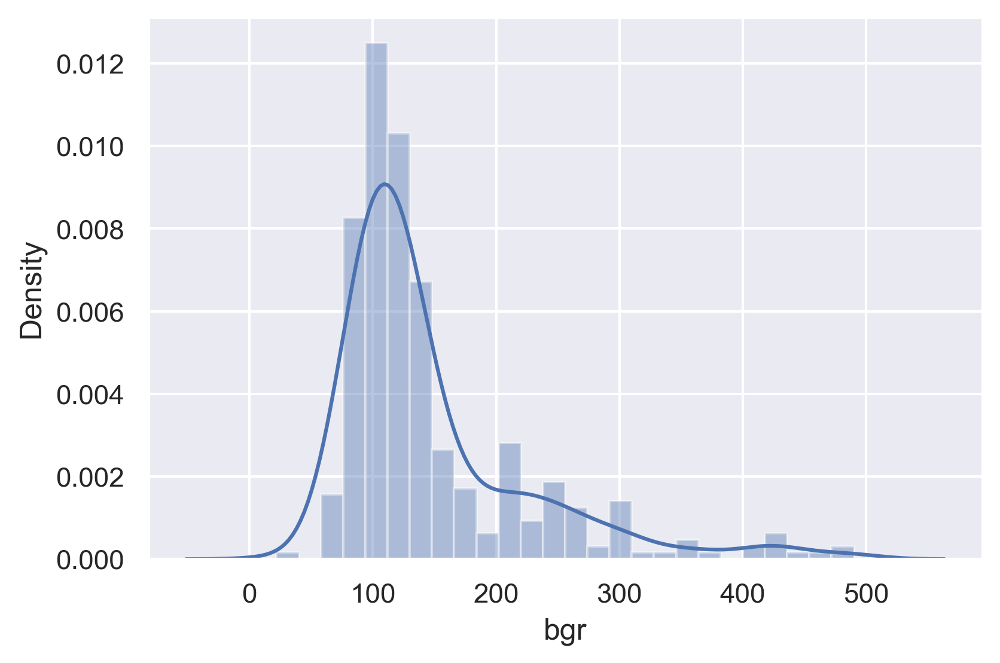

In [27]:
# by using the seaborn distribution plot for bgr
sns.distplot(ckd_dataset.bgr)

In [28]:
# Replace the null values with median value
ckd_dataset.bgr = ckd_dataset.bgr.replace(np.NaN,ckd_dataset.bgr.median())

# bu

In [29]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.bu.unique()

array([ 36. ,  18. ,  53. ,  56. ,  26. ,  25. ,  54. ,  31. ,  60. ,
       107. ,  55. ,  72. ,  86. ,  90. , 162. ,  46. ,  87. ,  27. ,
       148. , 180. , 163. ,   nan,  50. ,  75. ,  45. ,  28. , 155. ,
        33. ,  39. , 153. ,  29. ,  65. , 103. ,  70. ,  80. ,  20. ,
       202. ,  77. ,  89. ,  24. ,  17. ,  32. , 114. ,  66. ,  38. ,
       164. , 142. ,  96. , 391. ,  15. , 111. ,  73. ,  19. ,  92. ,
        35. ,  16. , 139. ,  48. ,  85. ,  98. , 186. ,  37. ,  47. ,
        52. ,  82. ,  51. , 106. ,  22. , 217. ,  88. , 118. ,  50.1,
        71. ,  34. ,  40. ,  21. , 219. ,  30. , 125. , 166. ,  49. ,
       208. , 176. ,  68. , 145. , 165. , 322. ,  23. , 235. , 132. ,
        76. ,  42. ,  44. ,  41. , 113. ,   1.5, 146. ,  58. , 133. ,
       137. ,  67. , 115. , 223. ,  98.6, 158. ,  94. ,  74. , 150. ,
        61. ,  57. ,  95. , 191. ,  93. , 241. ,  64. ,  79. , 215. ,
       309. ,  10. ])

C:\Users\M M N V SARMA\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='bu', ylabel='Density'>

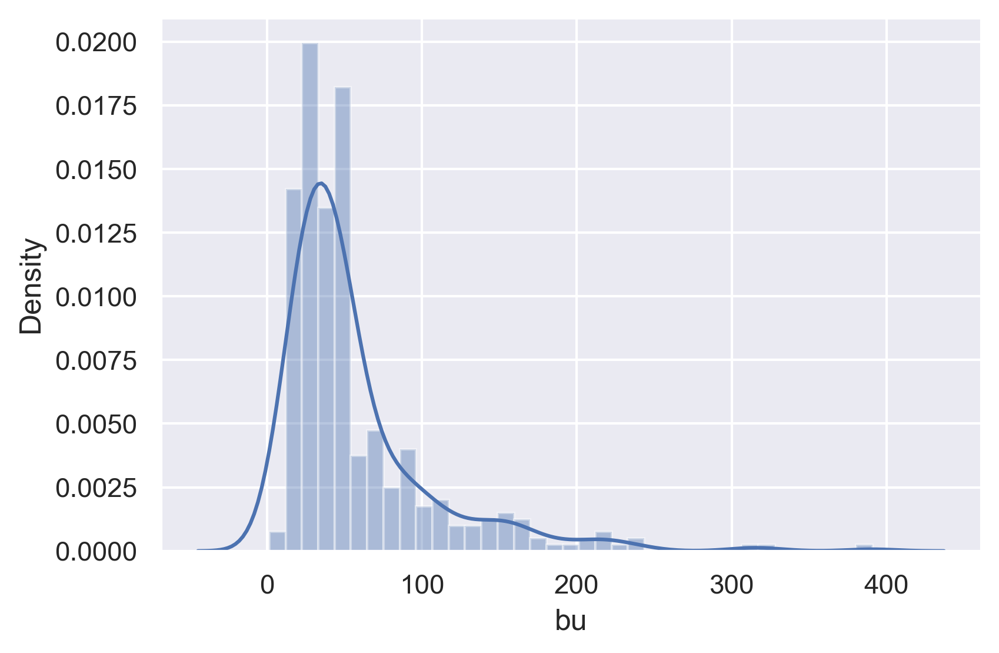

In [30]:
# by using the seaborn distribution plot for bu
sns.distplot(ckd_dataset.bu)

In [31]:
# Replace the null values with median value
ckd_dataset.bu = ckd_dataset.bu.replace(np.NaN,ckd_dataset.bu.median())

# sc

In [32]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.sc.unique()

array([ 1.2 ,  0.8 ,  1.8 ,  3.8 ,  1.4 ,  1.1 , 24.  ,  1.9 ,  7.2 ,
        4.  ,  2.7 ,  2.1 ,  4.6 ,  4.1 ,  9.6 ,  2.2 ,  5.2 ,  1.3 ,
        1.6 ,  3.9 , 76.  ,  7.7 ,   nan,  2.4 ,  7.3 ,  1.5 ,  2.5 ,
        2.  ,  3.4 ,  0.7 ,  1.  , 10.8 ,  6.3 ,  5.9 ,  0.9 ,  3.  ,
        3.25,  9.7 ,  6.4 ,  3.2 , 32.  ,  0.6 ,  6.1 ,  3.3 ,  6.7 ,
        8.5 ,  2.8 , 15.  ,  2.9 ,  1.7 ,  3.6 ,  5.6 ,  6.5 ,  4.4 ,
       10.2 , 11.5 ,  0.5 , 12.2 ,  5.3 ,  9.2 , 13.8 , 16.9 ,  6.  ,
        7.1 , 18.  ,  2.3 , 13.  , 48.1 , 14.2 , 16.4 ,  2.6 ,  7.5 ,
        4.3 , 18.1 , 11.8 ,  9.3 ,  6.8 , 13.5 , 12.8 , 11.9 , 12.  ,
       13.4 , 15.2 , 13.3 ,  0.4 ])

C:\Users\M M N V SARMA\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='sc', ylabel='Density'>

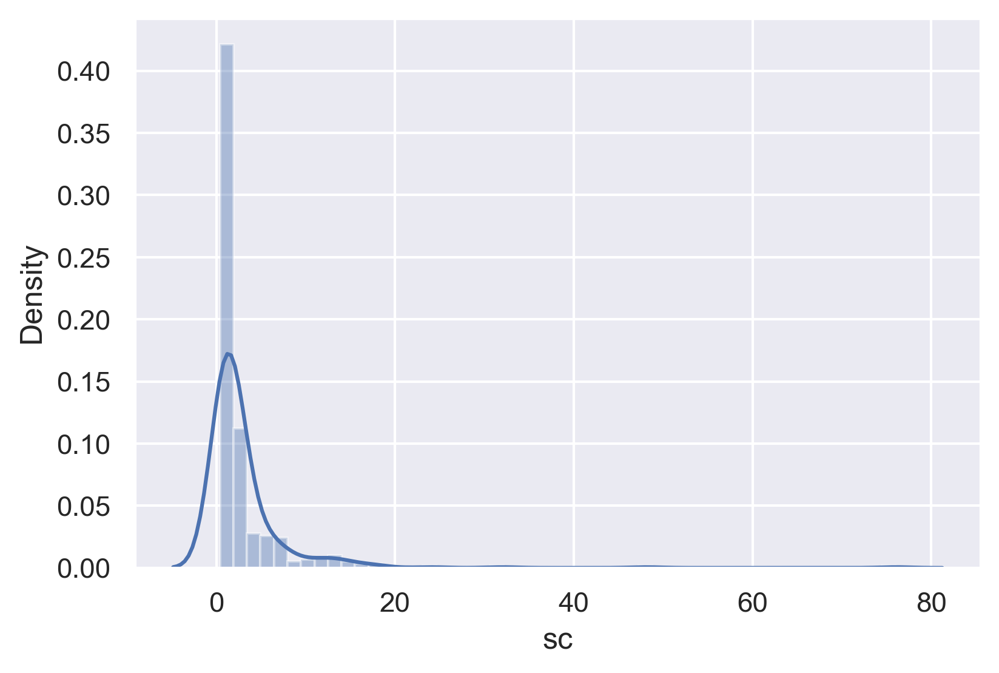

In [33]:
# by using the seaborn distribution plot for sc
sns.distplot(ckd_dataset.sc)

In [34]:
# Replace the null values with median value
ckd_dataset.sc = ckd_dataset.sc.replace(np.NaN,ckd_dataset.sc.median())

# sod

In [35]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.sod.unique()

array([  nan, 111. , 142. , 104. , 114. , 131. , 138. , 135. , 130. ,
       141. , 139. ,   4.5, 136. , 129. , 140. , 132. , 133. , 134. ,
       125. , 163. , 137. , 128. , 143. , 127. , 146. , 126. , 122. ,
       147. , 124. , 115. , 145. , 113. , 120. , 150. , 144. ])

C:\Users\M M N V SARMA\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='sod', ylabel='Density'>

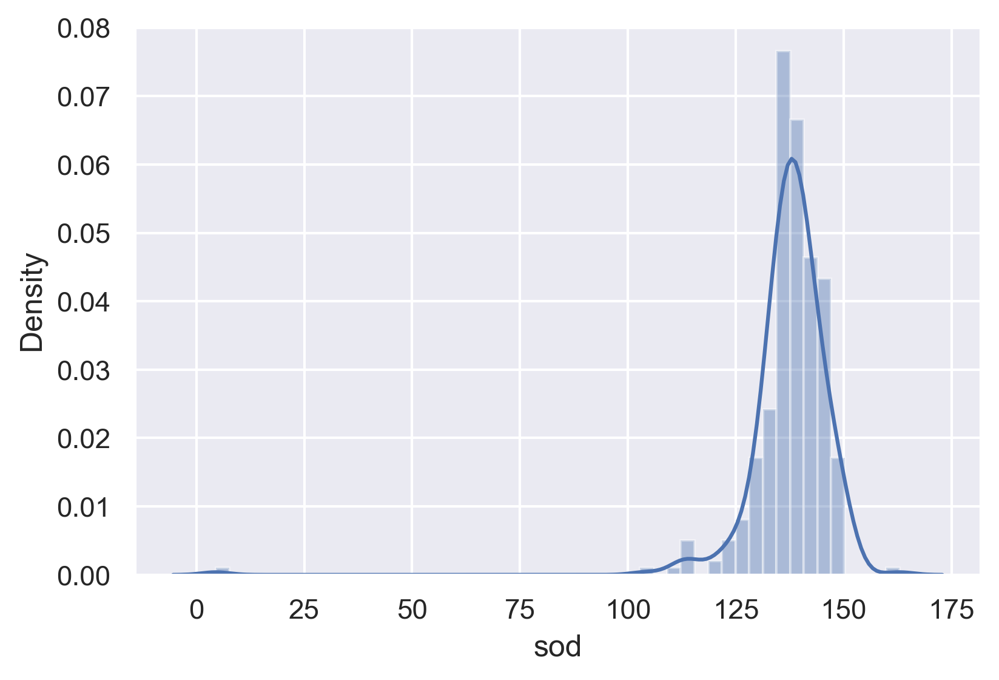

In [36]:
# by using the seaborn distribution plot for sod
sns.distplot(ckd_dataset.sod)

In [37]:
# Replace the null values with median value
ckd_dataset.sod = ckd_dataset.sod.replace(np.NaN,ckd_dataset.sod.median())

# pot

In [38]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.pot.unique()

array([ nan,  2.5,  3.2,  4. ,  3.7,  4.2,  5.8,  3.4,  6.4,  4.9,  4.1,
        4.3,  5.2,  3.8,  4.6,  3.9,  4.7,  5.9,  4.8,  4.4,  6.6, 39. ,
        5.5,  5. ,  3.5,  3.6,  7.6,  2.9,  4.5,  5.7,  5.4,  5.3, 47. ,
        6.3,  5.1,  5.6,  3. ,  2.8,  2.7,  6.5,  3.3])

C:\Users\M M N V SARMA\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='pot', ylabel='Density'>

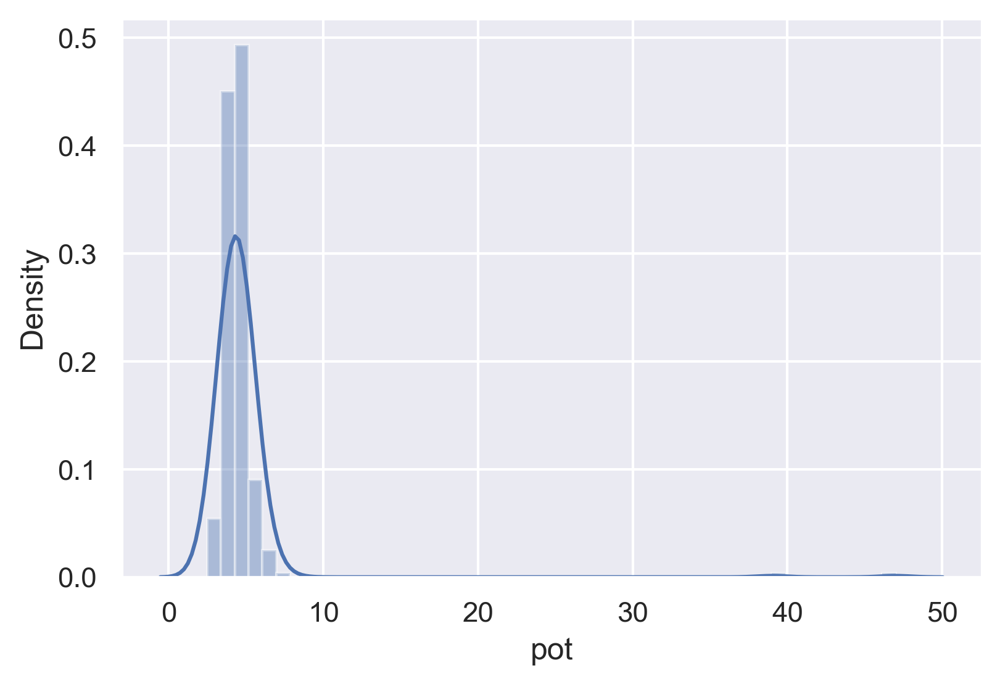

In [39]:
# by using the seaborn distribution plot for pot
sns.distplot(ckd_dataset.pot)

In [40]:
# Replace the null values with median value
ckd_dataset.pot = ckd_dataset.pot.replace(np.NaN,ckd_dataset.pot.median())

# hemo

In [41]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.hemo.unique()

array([15.4, 11.3,  9.6, 11.2, 11.6, 12.2, 12.4, 10.8,  9.5,  9.4,  9.7,
        9.8,  5.6,  7.6, 12.6, 12.1, 12.7, 10.3,  7.7, 10.9,  nan, 11.1,
        9.9, 12.5, 12.9, 10.1, 12. , 13. ,  7.9,  9.3, 15. , 10. ,  8.6,
       13.6, 10.2, 10.5,  6.6, 11. ,  7.5, 15.6, 15.2,  4.8,  9.1,  8.1,
       11.9, 13.5,  8.3,  7.1, 16.1, 10.4,  9.2,  6.2, 13.9, 14.1,  6. ,
       11.8, 11.7, 11.4, 14. ,  8.2, 13.2,  6.1,  8. , 12.3,  8.4, 14.3,
        9. ,  8.7, 10.6, 13.1, 10.7,  5.5,  5.8,  6.8,  8.8,  8.5, 13.8,
       11.5,  7.3, 13.7, 12.8, 13.4,  6.3,  3.1, 17. , 15.9, 14.5, 15.5,
       16.2, 14.4, 14.2, 16.3, 14.8, 16.5, 15.7, 13.3, 14.6, 16.4, 16.9,
       16. , 14.7, 16.6, 14.9, 16.7, 16.8, 15.8, 15.1, 17.1, 17.2, 15.3,
       17.3, 17.4, 17.7, 17.8, 17.5, 17.6])

C:\Users\M M N V SARMA\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='hemo', ylabel='Density'>

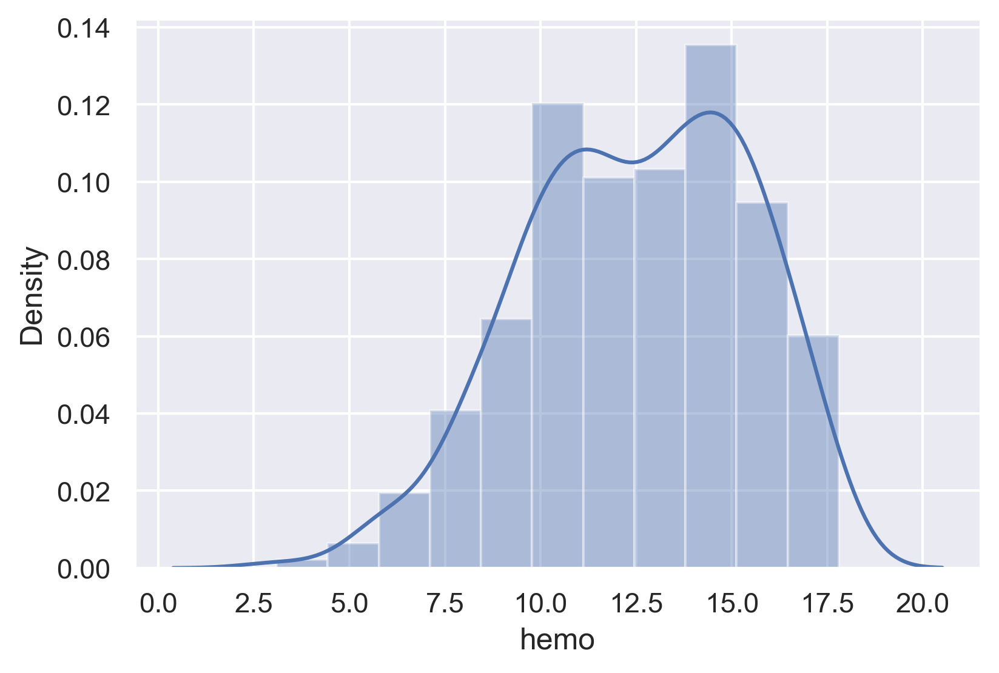

In [42]:
# by using the seaborn distribution plot for hemo
sns.distplot(ckd_dataset.hemo)

In [43]:
# Replace the null values with median value
ckd_dataset.hemo = ckd_dataset.hemo.replace(np.NaN,ckd_dataset.hemo.median())

# pcv

In [44]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.pcv.unique()

array([44., 38., 31., 32., 35., 39., 36., 33., 29., 28., nan, 16., 24.,
       37., 30., 34., 40., 45., 27., 48., 52., 14., 22., 18., 42., 17.,
       46., 23., 19., 25., 41., 26., 15., 21., 43., 20., 47.,  9., 49.,
       50., 53., 51., 54.])

C:\Users\M M N V SARMA\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='pcv', ylabel='Density'>

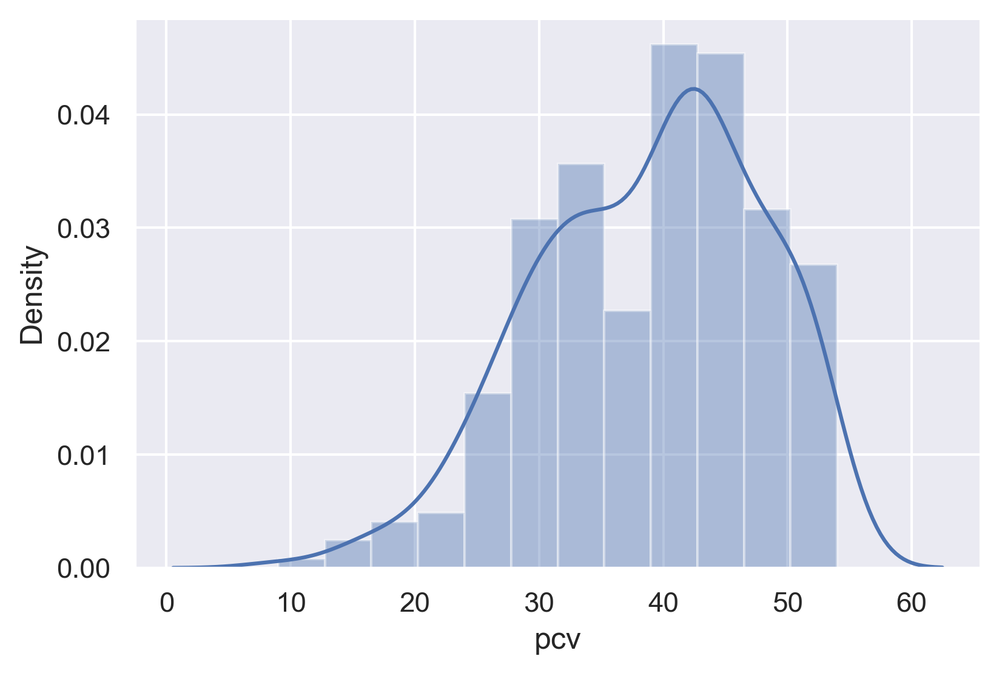

In [45]:
# by using the seaborn distribution plot for pcv
sns.distplot(ckd_dataset.pcv)

In [46]:
# Replace the null values with median value
ckd_dataset.pcv = ckd_dataset.pcv.replace(np.NaN,ckd_dataset.pcv.median())

# wbcc

In [47]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.wbcc.unique()

array([ 7800.,  6000.,  7500.,  6700.,  7300.,    nan,  6900.,  9600.,
       12100.,  4500., 12200., 11000.,  3800., 11400.,  5300.,  9200.,
        6200.,  8300.,  8400., 10300.,  9800.,  9100.,  7900.,  6400.,
        8600., 18900., 21600.,  4300.,  8500., 11300.,  7200.,  7700.,
       14600.,  6300.,  7100., 11800.,  9400.,  5500.,  5800., 13200.,
       12500.,  5600.,  7000., 11900., 10400., 10700., 12700.,  6800.,
        6500., 13600., 10200.,  9000., 14900.,  8200., 15200.,  5000.,
       16300., 12400., 10500.,  4200.,  4700., 10900.,  8100.,  9500.,
        2200., 12800., 11200., 19100., 12300., 16700.,  2600., 26400.,
        8800.,  7400.,  4900.,  8000., 12000., 15700.,  4100.,  5700.,
       11500.,  5400., 10800.,  9900.,  5200.,  5900.,  9300.,  9700.,
        5100.,  6600.])

C:\Users\M M N V SARMA\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='wbcc', ylabel='Density'>

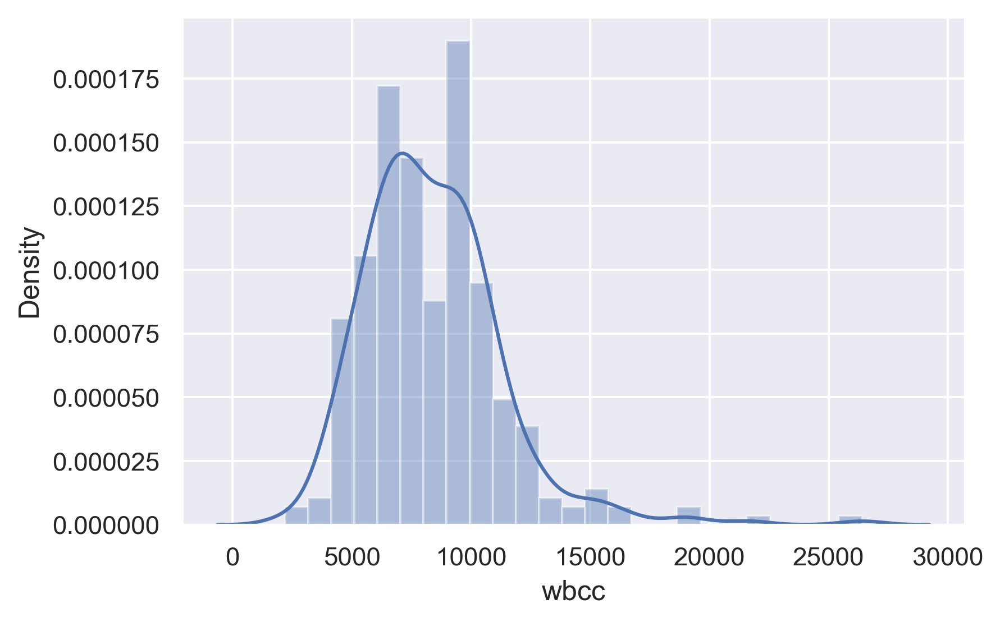

In [48]:
# by using the seaborn distribution plot for wbcc
sns.distplot(ckd_dataset.wbcc)

In [49]:
# Replace the null values with median value
ckd_dataset.wbcc = ckd_dataset.wbcc.replace(np.NaN,ckd_dataset.wbcc.median())

# rbcc

In [50]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.rbcc.unique()

array([5.2, nan, 3.9, 4.6, 4.4, 5. , 4. , 3.7, 3.8, 3.4, 2.6, 2.8, 4.3,
       3.2, 3.6, 4.1, 4.9, 2.5, 4.2, 4.5, 3.1, 4.7, 3.5, 6. , 2.1, 5.6,
       2.3, 2.9, 2.7, 8. , 3.3, 3. , 2.4, 4.8, 5.4, 6.1, 6.2, 6.3, 5.1,
       5.8, 5.5, 5.3, 6.4, 5.7, 5.9, 6.5])

C:\Users\M M N V SARMA\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='wbcc', ylabel='Density'>

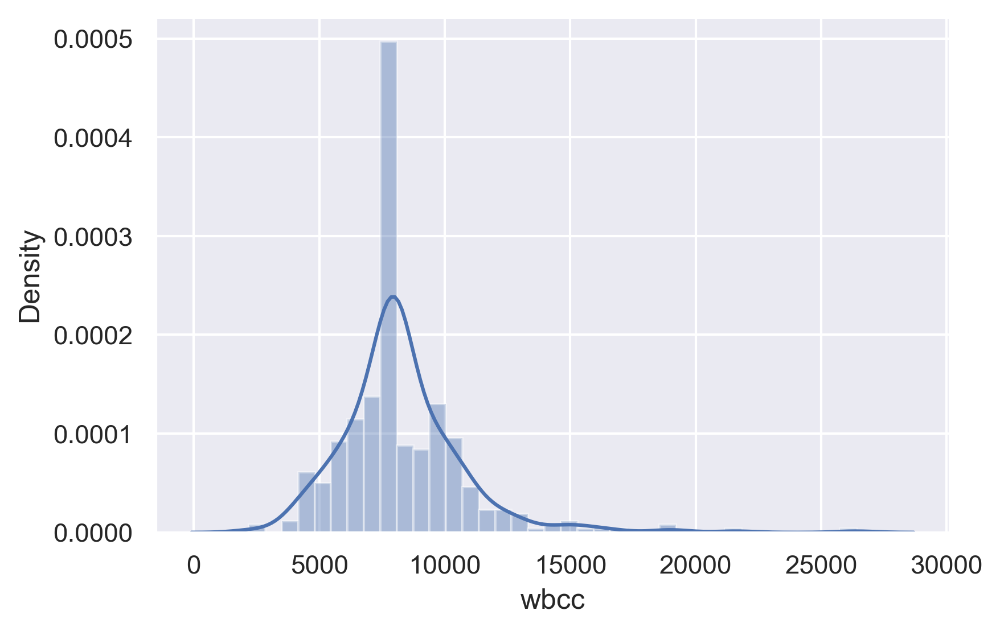

In [51]:
# by using the seaborn distribution plot for wbcc
sns.distplot(ckd_dataset.wbcc)

In [52]:
# Replace the null values with median value
ckd_dataset.rbcc = ckd_dataset.rbcc.replace(np.NaN,ckd_dataset.rbcc.median())

# htn

In [53]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.htn.unique()

array(['yes', 'no', nan], dtype=object)

In [54]:
# Replace the null values with mode value
ckd_dataset.htn = ckd_dataset.htn.replace(np.NaN,ckd_dataset.htn.mode()[0])

# dm

In [55]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.dm.unique()

array(['yes', 'no'], dtype=object)

In [56]:
# Replace the null values with mode value
ckd_dataset.dm = ckd_dataset.dm.replace(np.NaN,ckd_dataset.dm.mode()[0])

# cad

In [57]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.cad.unique()

array(['no', 'yes', nan], dtype=object)

In [58]:
# Replace the null values with mode value
ckd_dataset.cad = ckd_dataset.cad.replace(np.NaN,ckd_dataset.cad.mode()[0])

# appet

In [59]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.appet.unique()

array(['good', 'poor', nan], dtype=object)

In [60]:
# Replace the null values with mode value
ckd_dataset.appet = ckd_dataset.appet.replace(np.NaN,ckd_dataset.appet.mode()[0])

# pe

In [61]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.pe.unique()

array(['no', 'yes', nan], dtype=object)

In [62]:
# Replace the null values with mode value
ckd_dataset.pe = ckd_dataset.pe.replace(np.NaN,ckd_dataset.pe.mode()[0])

# ane

In [63]:
# find the uniques values which are repeated only once in the dataset
ckd_dataset.ane.unique()

array(['no', 'yes', nan], dtype=object)

In [64]:
# Replace the null values with mode value
ckd_dataset.ane = ckd_dataset.ane.replace(np.NaN,ckd_dataset.ane.mode()[0])

# No NaN values

In [65]:
# checking for null values
ckd_dataset.isnull().sum()

age      0
bp       0
sg       0
al       0
su       0
rbc      0
pc       0
pcc      0
ba       0
bgr      0
bu       0
sc       0
sod      0
pot      0
hemo     0
pcv      0
wbcc     0
rbcc     0
htn      0
dm       0
cad      0
appet    0
pe       0
ane      0
class    0
dtype: int64

# Handling Datatypes

In [66]:
# checking datatypes of the features
ckd_dataset.dtypes

age      float64
bp       float64
sg       float64
al       float64
su       float64
rbc       object
pc        object
pcc       object
ba        object
bgr      float64
bu       float64
sc       float64
sod      float64
pot      float64
hemo     float64
pcv      float64
wbcc     float64
rbcc     float64
htn       object
dm        object
cad       object
appet     object
pe        object
ane       object
class     object
dtype: object

In [67]:
# finding the unique values of the each datatype to find the datatype of the paricular feature
for i in ckd_dataset.columns:
    print("The unique values of {}:\n ".format(i),ckd_dataset[i].unique())

The unique values of age:
  [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 55. 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 44. 26. 64.
 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14. 27.
 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25. 20.
 29. 28. 22. 79.]
The unique values of bp:
  [ 80.  50.  70.  90. 100.  60. 110. 140. 180. 120.]
The unique values of sg:
  [1.02  1.01  1.005 1.015 1.025]
The unique values of al:
  [1. 4. 2. 3. 0. 5.]
The unique values of su:
  [0. 3. 4. 1. 2. 5.]
The unique values of rbc:
  ['normal' 'abnormal']
The unique values of pc:
  ['normal' 'abnormal']
The unique values of pcc:
  ['notpresent' 'present']
The unique values of ba:
  ['notpresent' 'present']
The unique values of bgr:
  [121. 423. 117. 106.  74. 100. 410. 138.  70. 490. 380. 208.  98. 157.
  76.  99. 114. 263. 173.  95. 108. 156. 264. 123.  93. 107. 159. 140.
 171. 270.  92. 137. 204.  79. 207. 124. 144.  91. 162. 

In [68]:
# substuating the feature dtype with real dtype
ckd_dataset[['age','wbcc','pcv']] = ckd_dataset[['age','wbcc','pcv']].astype('int64')
ckd_dataset.dtypes

age        int64
bp       float64
sg       float64
al       float64
su       float64
rbc       object
pc        object
pcc       object
ba        object
bgr      float64
bu       float64
sc       float64
sod      float64
pot      float64
hemo     float64
pcv        int64
wbcc       int64
rbcc     float64
htn       object
dm        object
cad       object
appet     object
pe        object
ane       object
class     object
dtype: object

# Data Visualization

<AxesSubplot:xlabel='class', ylabel='count'>

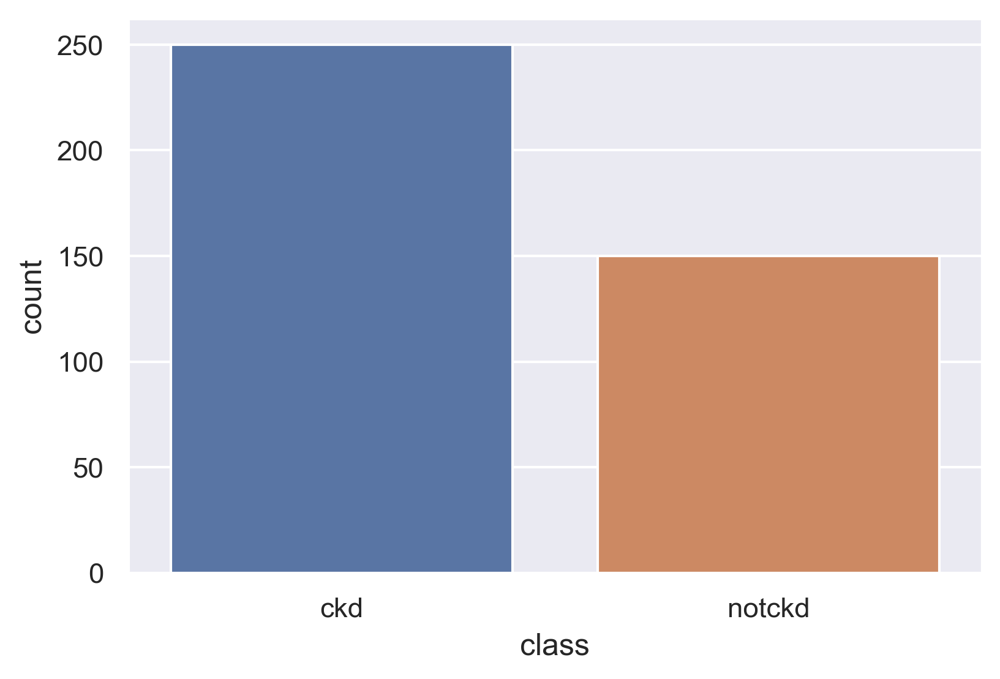

In [69]:
# fining the number of class values in the portion of the count
sns.countplot(x = 'class',data = ckd_dataset)

In [70]:
# using the pair plot to find the realtion between the features
numeric_value = ['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu','sc', 'sod', 'pot', 'hemo', 'pcv', 'wbcc', 'rbcc','class']
pairplot_1 = sns.pairplot(ckd_dataset[numeric_value],hue = 'class')
fig = pairplot_1.fig 
fig.subplots_adjust(top=0.93)
fig.suptitle('Chronic Kidney Disease', fontsize=50)


Text(0.5, 0.98, 'Chronic Kidney Disease')

<AxesSubplot:title={'center':'Chronic Kidney Disease Features Correlation'}>

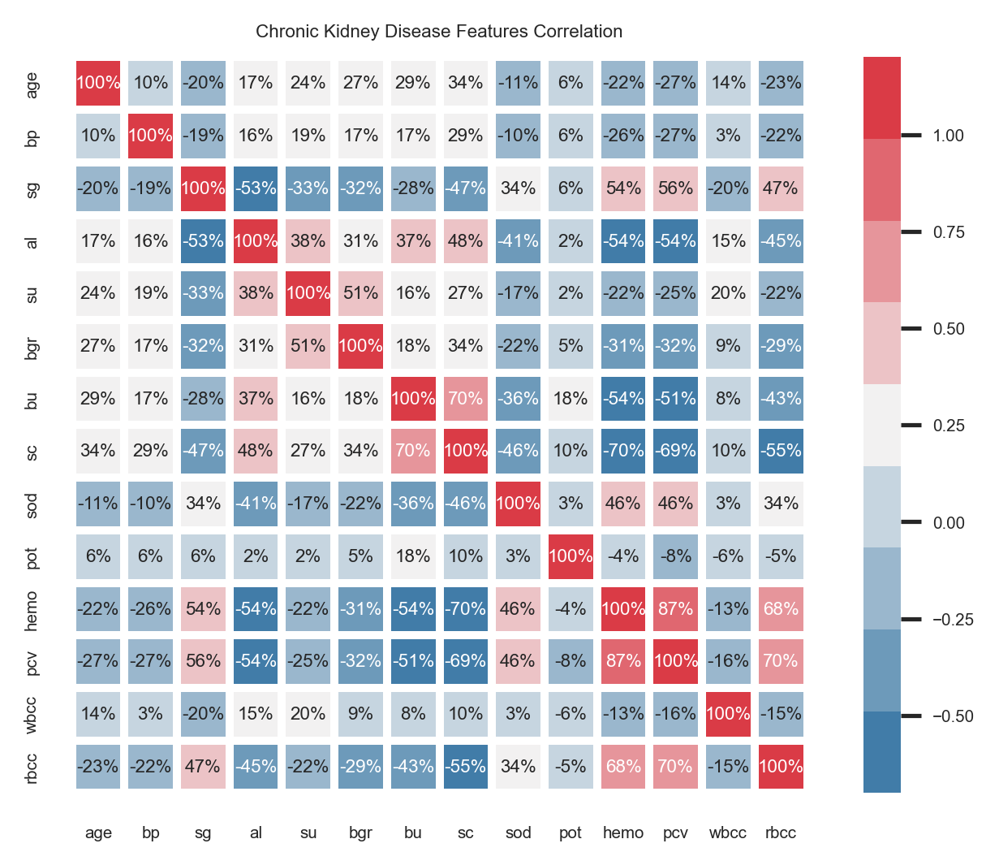

In [71]:
#by unsing the spearman correlation matrix to find the percentage of the relation used in this feature
sns.set(font_scale=0.45)
numeric_value = ['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu','sc', 'sod', 'pot', 'hemo', 'pcv', 'wbcc', 'rbcc','class']
plt.title('Chronic Kidney Disease Features Correlation')
cmap = sns.diverging_palette(240, 10, n=9)
sns.heatmap(ckd_dataset.corr("spearman"),vmax=1.2, annot=True, square='square', cmap=cmap, fmt = '.0%', linewidths=2)

In [72]:
# defining the function to find the highly co-related feature in the dataset
def spearman_correlation(x,t):
    correlated_column = list()
    matrix_dataset = ckd_dataset.corr('spearman')
    for i in range(len(matrix_dataset.columns)):
        for j in range(i):
            if abs(matrix_dataset.iloc[i,j]) > t:
                column_name = matrix_dataset.columns[i]
                correlated_column.append(column_name)
    return correlated_column

In [73]:
# passing the parameters of the dataset and threshold value 
correlated_column = spearman_correlation(ckd_dataset,0.85)
correlated_column

['pcv']

<AxesSubplot:xlabel='pcv', ylabel='hemo'>

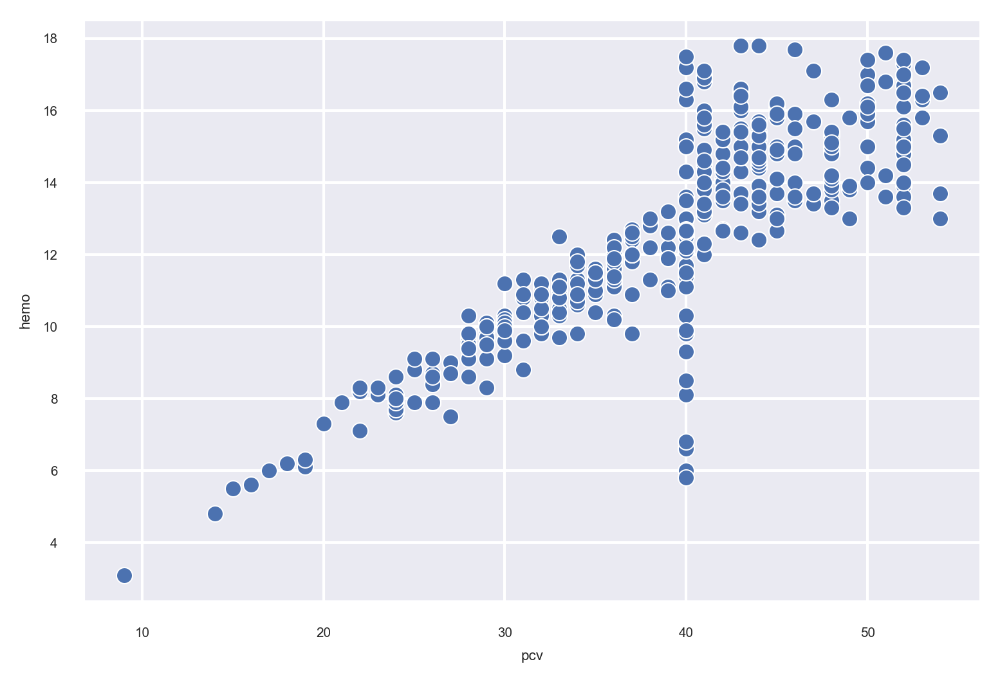

In [74]:
# finding the realation between the pcv vs hemo using scatter plot
sns.scatterplot(x = 'pcv',y = 'hemo',data = ckd_dataset)

<AxesSubplot:xlabel='rbcc', ylabel='pcv'>

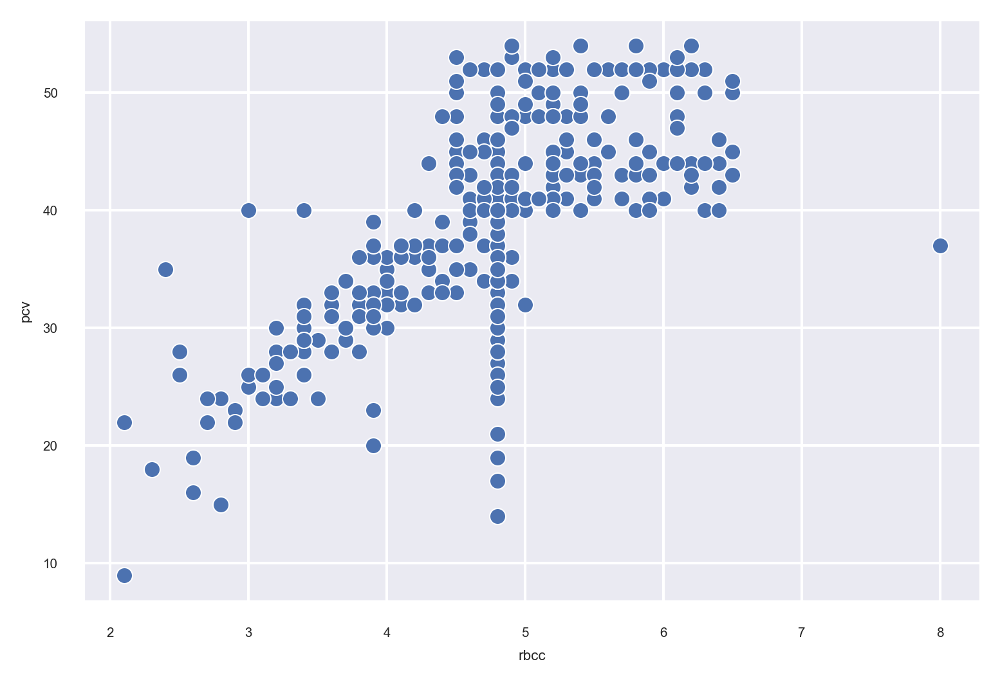

In [75]:
# finding the realation between the rbcc vs pcv using scatter plot
sns.scatterplot(x = 'rbcc',y = 'pcv',data = ckd_dataset)

<AxesSubplot:xlabel='sc', ylabel='bu'>

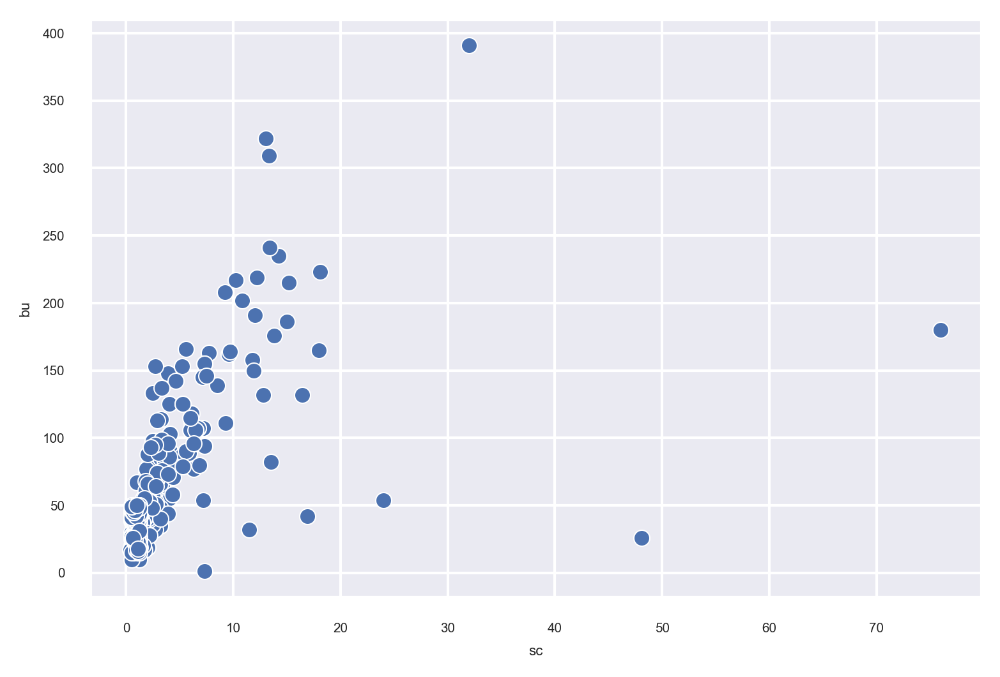

In [76]:
# finding the realation between the sc vs bu using scatter plot
sns.scatterplot(x = 'sc',y = 'bu',data = ckd_dataset)

# Label Encoding

In [77]:
# encoding the categorical values with numerical values in which machine learning algorithm can read
encode = {"rbc": {"normal": 1, "abnormal": 0},
           "pc": {"normal": 1, "abnormal": 0},
           "pcc": {"present": 1, "notpresent": 0},
           "ba": {"present": 1, "notpresent": 0},
           "htn": {"yes": 1, "no": 0},
           "dm": {"yes": 1, "no": 0},
           "cad": {"yes": 1, "no": 0},
           "appet": {"good": 1, "poor": 0},
           "pe": {"yes": 1, "no": 0},
           "ane": {"yes": 1, "no": 0},
           "class": {"ckd" : 1, "notckd" : 0}}
        
ckd_dataset.replace(encode,inplace = True)
ckd_dataset.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wbcc,rbcc,htn,dm,cad,appet,pe,ane,class
0,48,80.0,1.020,1.0,0.0,1,1,0,0,121.0,36.0,1.2,138.0,4.4,15.4,44,7800,5.2,1,1,0,1,0,0,1
1,7,50.0,1.020,4.0,0.0,1,1,0,0,121.0,18.0,0.8,138.0,4.4,11.3,38,6000,4.8,0,0,0,1,0,0,1
2,62,80.0,1.010,2.0,3.0,1,1,0,0,423.0,53.0,1.8,138.0,4.4,9.6,31,7500,4.8,0,1,0,0,0,1,1
3,48,70.0,1.005,4.0,0.0,1,0,1,0,117.0,56.0,3.8,111.0,2.5,11.2,32,6700,3.9,1,0,0,0,1,1,1
4,51,80.0,1.010,2.0,0.0,1,1,0,0,106.0,26.0,1.4,138.0,4.4,11.6,35,7300,4.6,0,0,0,1,0,0,1


In [78]:
# rechecking the datatype afer the label encoding
ckd_dataset.dtypes

age        int64
bp       float64
sg       float64
al       float64
su       float64
rbc        int64
pc         int64
pcc        int64
ba         int64
bgr      float64
bu       float64
sc       float64
sod      float64
pot      float64
hemo     float64
pcv        int64
wbcc       int64
rbcc     float64
htn        int64
dm         int64
cad        int64
appet      int64
pe         int64
ane        int64
class      int64
dtype: object

# Feature Selection

## Relation between the continuous data columns and and class data column by using one-way Anova test

In [79]:
# statistically significant difference between the means of two or more independent groups, you can use a one-way analysis of variance
column_names = ['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu','sc', 'sod', 'pot', 'hemo', 'pcv', 'wbcc', 'rbcc','class']
one_way_anova = ckd_dataset[column_names]
grps = pd.unique(one_way_anova['class'].values)

for i in range(len(one_way_anova.columns)-1):
    d_data = {grp:one_way_anova[one_way_anova.columns[i]][one_way_anova['class'] == grp] for grp in grps}
    
    _, p = stats.f_oneway(d_data[0], d_data[1])
    
    print("P_Value of {} and Class".format(one_way_anova.columns[i]), p)
    
    if p < 0.05:
        
        print("There is relation between {} and Class\n".format(one_way_anova.columns[i]))
        
    else:
        
        print("There is no relation between {} and Class\n".format(one_way_anova.columns[i]))

P_Value of age and Class 4.159405859198484e-06
There is relation between age and Class

P_Value of bp and Class 2.1239118488998354e-09
There is relation between bp and Class

P_Value of sg and Class 2.7992458999667935e-51
There is relation between sg and Class

P_Value of al and Class 1.4962806922593082e-30
There is relation between al and Class

P_Value of su and Class 1.8963659191003184e-09
There is relation between su and Class

P_Value of bgr and Class 3.894547360688507e-15
There is relation between bgr and Class

P_Value of bu and Class 2.2322380822924144e-14
There is relation between bu and Class

P_Value of sc and Class 2.923398800947858e-09
There is relation between sc and Class

P_Value of sod and Class 6.129139402641425e-12
There is relation between sod and Class

P_Value of pot and Class 0.1930314179728708
There is no relation between pot and Class

P_Value of hemo and Class 8.421310878217525e-67
There is relation between hemo and Class

P_Value of pcv and Class 4.1265381546

In [80]:
# The point biserial correlation coefficient it measures the relationship between two variables
val1 = np.array(ckd_dataset['pot'])
val2 = np.array(ckd_dataset['class'])
_,p = stats.pointbiserialr(val1,val2)
print(p)
if p < 0.05:
    print("There is a relation between potassium and class\n")
else:
    print("There is no relation between potassium and class\n")

0.19303141797279627
There is no relation between potassium and class



#### so to drop PCV and pot columns
#### Because pcv has highly co-related with hemo
#### pot is no correlation with class

In [81]:
ckd_dataset.drop(['pcv','pot'],axis = 1,inplace = True)
ckd_dataset.shape

(400, 23)

# Dropping the categorical data

In [82]:
# by chi2 test we can find the relation between the features
categorical_variable = ckd_dataset[['sg','al','su','rbc','pc','pcc','ba','htn','dm','cad','appet','pe','ane']]
class_variable = ckd_dataset[['class']]
f_p_value = chi2(categorical_variable,class_variable)
p_values = pd.Series(f_p_value[1])
p_values.index = ['sg', 'al', 'su', 'rbc', 'pcc', 'pc', 'ba', 'htn', 'dm', 'cad', 'pe', 'ane', 'appet']
p_values.sort_values(ascending=False)

sg       9.434296e-01
rbc      5.266006e-02
pcc      1.073502e-03
pe       3.682474e-04
ba       2.799491e-04
cad      6.282980e-06
pc       5.168220e-07
appet    1.973175e-09
ane      1.450416e-11
dm       1.229899e-19
htn      5.915991e-21
su       2.106256e-22
al       6.744058e-49
dtype: float64

# Null Hypothesis: The null hypothesis states that there is no relationship between the two variables

In [83]:
## by chi2 test p_value based analysis to drop the columns
count = 0
for k in p_values:
    if k > 0.05:
        print("There is no relationship", p_values.index[count], k)
    else:
        print("There is relationship", p_values.index[count], k)
    
    count += 1

There is no relationship sg 0.9434296212554507
There is relationship al 6.744057652239431e-49
There is relationship su 2.1062564232073927e-22
There is no relationship rbc 0.052660056620230336
There is relationship pcc 0.0010735022801971507
There is relationship pc 5.16821975381135e-07
There is relationship ba 0.00027994911788008583
There is relationship htn 5.9159906568766745e-21
There is relationship dm 1.2298987440045423e-19
There is relationship cad 6.28297952984215e-06
There is relationship pe 0.0003682474162699459
There is relationship ane 1.4504158047731098e-11
There is relationship appet 1.9731752900753933e-09


##### Specific Gravity has no correlation with class

In [84]:
# dropping the 'sg' and 'rbc' value from the dataset because there is no relation with class feature
ckd_dataset.drop(['sg','rbc'],axis = 1,inplace = True)
ckd_dataset.columns

Index(['age', 'bp', 'al', 'su', 'pc', 'pcc', 'ba', 'bgr', 'bu', 'sc', 'sod',
       'hemo', 'wbcc', 'rbcc', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane',
       'class'],
      dtype='object')

# splitting of data,standardization,balancing

#### Separating input and output Features

In [85]:
#feature Selection
# input features
X = ckd_dataset.iloc[:,:-1]
# output features
Y = ckd_dataset.iloc[:,-1]

##### Standardization of the data

In [86]:
#calling StandardScaler() method and create an object Scaler
scaler = StandardScaler()
# Transform the data into z-distribution by fitting the input features
features = scaler.fit_transform(X)
#Printing the shape of the data 
print(features.shape)
features

(400, 20)


array([[-0.21003135,  0.25421378,  0.07624929, ...,  0.50780078,
        -0.4843221 , -0.42008403],
       [-2.62723421, -1.97247624,  2.36372784, ...,  0.50780078,
        -0.4843221 , -0.42008403],
       [ 0.615355  ,  0.25421378,  0.83874214, ..., -1.96927621,
        -0.4843221 ,  2.38047614],
       ...,
       [-2.33245337,  0.25421378, -0.68624357, ...,  0.50780078,
        -0.4843221 , -0.42008403],
       [-2.03767254, -1.23024623, -0.68624357, ...,  0.50780078,
        -0.4843221 , -0.42008403],
       [ 0.37953033,  0.25421378, -0.68624357, ...,  0.50780078,
        -0.4843221 , -0.42008403]])

In [87]:
features.shape

(400, 20)

# Splitting the data into train and test data

In [88]:
# Splitting the data into training data and Testing Data
X_train,X_test,Y_train,Y_test = train_test_split(features,Y,test_size=0.3,random_state = 100)

# Balancing Data

In [89]:
# finding the length of the Y_train balance of the division
len(Y_train[Y_train==1]),len(Y_train[Y_train==0]),Y_train.shape

(170, 110, (280,))

# up-Sampling 

In [90]:
#calling RandomoverSampler() method and create an object DownSampling
upSampling =  RandomOverSampler(sampling_strategy=1)

# fit the imbalanced data X_train and Y_train on Down Sampling
X_train_up, Y_train_up = upSampling.fit_resample(X_train, Y_train)

# finding the length of the Y_train and X_train values
print(len(Y_train_up[Y_train_up==1]),len(Y_train_up[Y_train_up==0]))
print(len(X_train_up))

170 170
340


# Down-Sampling

In [91]:
#calling RandomUnderSampler() method and create an object DownSampling
DownSampling =  RandomUnderSampler()

# fit the imbalanced data X_train and Y_train on Down Sampling 
X_train_down, Y_train_down = DownSampling.fit_resample(X_train, Y_train)

# finding the length of the Y_train and X_train values
print(len(Y_train_down[Y_train_down==1]),len(Y_train_down[Y_train_down==0]))
print(len(X_train_down))

110 110
220


# Modeling

###### Random Forest

In [94]:
rf_ = RandomForestClassifier()
# fit on randomforest
rf_ = rf_.fit(X_train_up, Y_train_up)

# predict the x_test values for y_test
Y_test_pred_rf = rf_.predict(X_test)



# Evaluation

1.0
1.0

			 Confusion Matrix

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        80

    accuracy                           1.00       120
   macro avg       1.00      1.00      1.00       120
weighted avg       1.00      1.00      1.00       120



C:\Users\M M N V SARMA\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


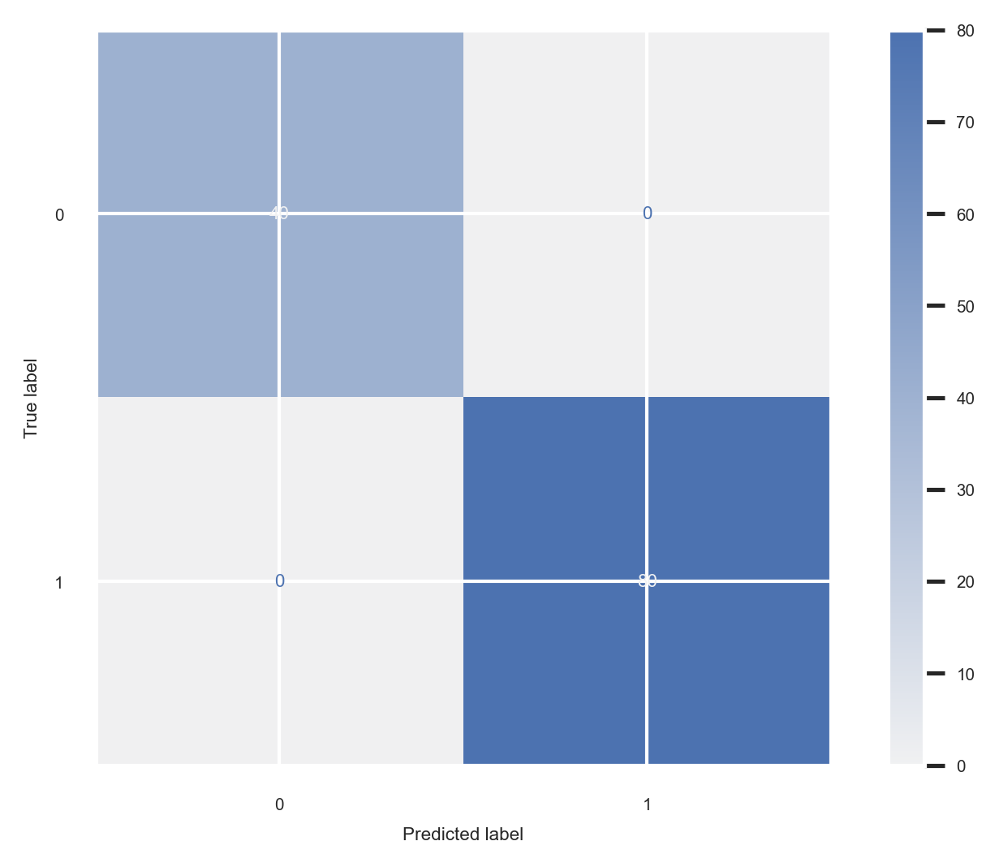

In [95]:
#comparision score for X_train_up and Y_train_up
print(rf_.score(X_train_up,Y_train_up))

#comparision between X_test and y_test and find the score
print(rf_.score(X_test,Y_test))

#comparision between y_test and y_test_predict and find the score
print()
print("\t\t\t Confusion Matrix\n")
print(metrics.classification_report(Y_test, Y_test_pred_rf))


map = sns.color_palette("light:b", as_cmap=True)
plot_confusion_matrix(rf_,X_test,Y_test,cmap = map)
plt.show()



# Deployment

In [96]:
from joblib import dump
dump(rf_,'CKD_1.joblib')

['CKD_1.joblib']

# Load a Model

In [97]:
from joblib import load

print("_"*100)
print("\t\t\t chronic kidney Disease (CKD) Prediction System")
print("_"*100)
print()


Age = int(input("Enter the Age of Patient :"))
bp = float(input("Blood Pressure bp in mm/Hg : "))
al = int(input("Albumin al - (0,1,2,3,4,5) :"))
su = int(input("Sugar su - (0,1,2,3,4,5) :"))
pc = int(input("Pus Cell pc - (normal = 1,abnormal = 0): "))
pcc = int(input("Pus Cell clumps pcc - (present = 1,notpresent = 0): "))
ba = int(input("Bacteria ba - (present = 1,notpresent = 0): "))
bgr = float(input("Blood Glucose Random -bgr in mgs/dl: "))
bu = float(input("Blood Urea bu in mgs/dl: "))
sc = float(input("Serum Creatinine sc in mgs/dl: "))
sod = float(input("Sodium sod in mEq/L: "))
hemo = float(input("Hemoglobin hemo in gms: "))
wc = float(input("White Blood Cell Count (numerical) wc in cells/cumm: "))
rc = float(input("Red Blood Cell Count(numerical) rc in millions/cmm: "))
htn = int(input("Hypertension(nominal) htn - (yes = 1,no = 0): "))
dm = int(input("Diabetes Mellitus(nominal) dm - (yes = 1,no = 0): "))
cad = int(input("Coronary Artery Disease(nominal) cad - (yes = 1,no = 0): "))
appet = int(input("Appetite(nominal)appet - (good = 1,poor = 0): "))
pe = int(input("Pedal Edema(nominal) pe - (yes = 1,no = 0): "))
ane = int(input("Anemia(nominal)ane - (yes = 1,no = 0): "))
loaded_model = load('CKD_1.joblib')
k = [Age,bp,al,su,pc,pcc,ba,bgr,bu,sc,sod,hemo,wc,rc,htn,dm,cad,appet,pe,ane]
loaded_model = load('CKD_1.joblib')
lst = loaded_model.predict([k])
print("_"*100)
if lst == 1:
          print("You have chronic kidney Disease (CKD) please contact a doctor ")
else:
          print("Your are safe drink more water ")
print("_"*100)


____________________________________________________________________________________________________
			 chronic kidney Disease (CKD) Prediction System
____________________________________________________________________________________________________

Enter the Age of Patient :62
Blood Pressure bp in mm/Hg : 80
Albumin al - (0,1,2,3,4,5) :2
Sugar su - (0,1,2,3,4,5) :3
Pus Cell pc - (normal = 1,abnormal = 0): 1
Pus Cell clumps pcc - (present = 1,notpresent = 0): 0
Bacteria ba - (present = 1,notpresent = 0): 0
Blood Glucose Random -bgr in mgs/dl: 423
Blood Urea bu in mgs/dl: 53
Serum Creatinine sc in mgs/dl: 1.8
Sodium sod in mEq/L: 137.53
Hemoglobin hemo in gms: 9.6
White Blood Cell Count (numerical) wc in cells/cumm: 7500
Red Blood Cell Count(numerical) rc in millions/cmm: 4.71
Hypertension(nominal) htn - (yes = 1,no = 0): 0
Diabetes Mellitus(nominal) dm - (yes = 1,no = 0): 1
Coronary Artery Disease(nominal) cad - (yes = 1,no = 0): 0
Appetite(nominal)appet - (good = 1,poor = 0): 0
Pe